# How do we solve Equilibrium?

In this notebook, we will give a brief overview of how we treat the 3D ideal MHD equilibrium as an optimization problem. First of all, here are the ideal MHD equations,

$$\nabla \cdot \mathbf{B} = 0 $$
$$\nabla \times \mathbf{B} = \mu_0 \mathbf{J} $$
$$\mathbf{J} \times \mathbf{B} = \nabla p  $$

We will use flux coordinates $(\rho, \theta, \zeta)$ for the derivations. Then, we can write a general magnetic field in contravariant form as,

$$
    \mathbf{B} = B^{\rho}\mathbf{e}_{\rho} + B^{\theta}\mathbf{e}_{\theta} + B^{\zeta}\mathbf{e}_{\zeta}
$$

We will explain the covariant and contravariant basis vectors in detail in another notebook. For the sake of this notebook, you can just think of them as a curvilinear coordinate system.

Assuming the flux surfaces are nested, we conclude that there is no radial component of the magnetic field, so $\mathbf{B}\cdot\nabla \rho=0$ and the $B^{\rho}$ term drops out. Applying $\nabla \cdot \mathbf{B}=0$,

$$
    \cfrac{1}{\sqrt{g}}\left(\cfrac{\partial(B^\theta\sqrt{g})}{\partial\theta} + \cfrac{\partial(B^\zeta\sqrt{g})}{\partial\zeta}\right) = 0  \hspace{2cm} \text{where } \sqrt{g} = R \left( \cfrac{\partial R}{\partial \rho}  \cfrac{\partial Z}{\partial \theta} + \cfrac{\partial R}{\partial \theta}  \cfrac{\partial Z}{\partial \rho} \right)
$$

$\sqrt{g}$ is the determinant of the Jacobian matrix. Hence,

$$
    \cfrac{\partial(B^\theta\sqrt{g})}{\partial\theta} = - \cfrac{\partial(B^\zeta\sqrt{g})}{\partial\zeta}
$$

Applying the condition of total toroidal and poloidal flux (for the latter use the definition of $\iota = \cfrac{\partial\psi_P/\partial\rho}{\partial\psi_T/\partial\rho}$), we get,

$$
    \mathbf{B} = \cfrac{1}{2\pi\sqrt{g}}\frac{d\psi_T}{d\rho}\begin{bmatrix}
        \left(\iota - \cfrac{\partial\lambda(\rho,\theta,\zeta)}{\partial\zeta}\right)\mathbf{e}_\theta  +
        \left(1 + \cfrac{\partial\lambda(\rho,\theta,\zeta)}{\partial\theta}\right) \mathbf{e}_\zeta
    \end{bmatrix}  
$$

The above equation states that for given functions $R(\rho, \theta, \zeta), Z(\rho, \theta, \zeta)$ and $\lambda(\rho, \theta, \zeta)$, the magnetic field can be found. We will use this fact and transform solving the 3D ideal MHD equations into a flux surface shape optimization problem. To describe the surfaces and $\lambda$, we will use Fourier-Zernike basis. In DESC, we have a dedicated `FourierZernikeBasis` class for these. Then, the spectral parametrized functions become,

$$
    R(\rho,\theta,\zeta) = \sum_{m=-M,n=-N,l=0}^{M,N,L} R_{lmn} \mathcal{Z}_l^m (\rho,\theta) \mathcal{F}^n(\zeta)
$$

$$
    Z(\rho,\theta,\zeta) = \sum_{m=-M,n=-N,l=0}^{M,N,L} Z_{lmn} \mathcal{Z}_l^m (\rho,\theta) \mathcal{F}^n(\zeta)
$$

$$
    \lambda(\rho,\theta,\zeta) = \sum_{m=-M,n=-N,l=0}^{M,N,L} \lambda_{lmn} \mathcal{Z}_l^m (\rho,\theta) \mathcal{F}^n(\zeta)
$$

In theory, by increasing the resolutions L, M and N, we can parametrize any surface since the chosen polynoms are orthogonal.

## Optimization Problem

We can write the force error minimization as follows,

$$\text{minimize} \hspace{1cm}    ||\mathbf{J}\times\mathbf{B} - \nabla p||_2^2 $$
$$\text{subject to} \hspace{1.5cm}    \mathbf{A\bar{x}=b}  $$

In DESC, we use $\bar{x}$ which includes both optimization and constraint parameters since they are useful for general stellarator optimization problem (i.e. allowing last closed flux surface, LCFS, to change to get better QA/QH etc.). However, the objectives are function of $\mathbf{x}$ only.
$$
    \mathbf{\bar{x}} = \begin{bmatrix}
        \mathbf{x}\\
        \mathbf{c}\\
    \end{bmatrix} \hspace{1cm} \mathbf{x} = \begin{bmatrix}
        \mathbf{R_{lmn}}\\
        \mathbf{Z_{lmn}}\\
        \boldsymbol{\lambda_{lmn}}\\
    \end{bmatrix} \hspace{1cm}   \mathbf{c} = \begin{bmatrix}
        \mathbf{R^b_{mn}}\\
        \mathbf{Z^b_{mn}}\\
        \mathbf{p_{l}}\\
        \boldsymbol{\iota_{l}}\\
        \psi_{a}\\
    \end{bmatrix}
$$
For pure force minimization problem, all of our constraints are linear and can be written by $\mathbf{A\bar{x}=b}$ where $\mathbf{A}$ is the constraint matrix and $\mathbf{b}$ is the target for constraints, but in general, we can have some non-linear constraints too. DESC offers different initialization methods, but we will focus on LCFS boundary condition. In addition to boundary shape, we need to give pressure profile and iota or current profile.

## Constrained to Unconstrained Optimization
The problem formulated above is a constrained optimization problem. Ideally, we want to have unconstrained optimization. For this setup, it can be done by first computing the null-space of $\mathbf{A}$, thus we have,

$$\mathbf{AZ}=0$$
$$\mathbf{A\bar{x}} = \mathbf{A(x_{particular} + Zy) = b}$$
$$\mathbf{Z}^T\mathbf{Z} = \mathbb{I}  $$

This approach requires us to solve $\mathbf{Ax_{particular}=b}$ and find the null-space only once at the beginning, then the actual optimization iterations can use unconstrained $y$. From linear algebra, it is known that null-space can be found by singular value decomposition (SVD). Moreover, once we get the SVD, it is significantly easier to solve linear system $\mathbf{Ax_{particular}=b}$. All of these steps are implemented in `desc.objectives.utils.factorize_linear_constraints` function.

$$\mathbf{A} = \mathbf{U\Sigma V^T} \hspace{1cm} \mathbf{U}\in \mathbb{R}^{m\times m},  \mathbf{\Sigma}\in \mathbb{R}^{m\times n}, \mathbf{V}\in \mathbb{R}^{n\times n}$$
$$\mathbf{U}\mathbf{U}^T = \mathbb{I} \hspace{1cm} \mathbf{V}\mathbf{V}^T = \mathbb{I} $$

In the code, we refer to `y` as `reduced state vector` or `x_reduced`. `factorize_linear_constraints` function will also provide `project` and `recover` methods that enables going back and forth between $\bar{x}$ and `x_reduced`.

$$\textbf{project}(\mathbf{\bar{x}}) = \mathbf{Z}^T \mathbf{(\bar{x}-x_{particular}) = x_{reduced} = y}$$
$$\textbf{recover}\mathbf{(x_{reduced}) = x_{particular} +  Zx_{reduced} = \bar{x}}$$

## Iterations in a nutshell

DESC offers different optimizers. Unless the users specifies another optimizer, the default one is least square with trust region, in the code `lsqtr`. Here, we will show you briefly how a gradient descent based method works. First, for convenience, the objective function will be called f(x) (here the x is not strictly one of the x's defined above),

$$f(x) = ||\mathbf{J} \times \mathbf{B} - \nabla p||^2$$

Taylor expanding the function a close distance $\Delta x$ around point x,

$$f(x+\Delta x) = f(x) + \cfrac{df}{dx}\Delta x + \mathcal{O}(\Delta x^2)  $$

For multivariable functions, $\cfrac{d\mathbf{f}}{d\mathbf{x}}$ becomes a matrix known as the Jacobian. We can also represent it with gradient, so $\cfrac{d\mathbf{f}}{d\mathbf{x}}=\nabla \mathbf{f}= \mathbf{J}$,

$$\mathbf{J} = \cfrac{d\mathbf{f}}{d\mathbf{x}} = \begin{bmatrix} \cfrac{\partial \mathbf{f}}{\partial x_1} & \cfrac{\partial \mathbf{f}}{\partial x_2} & ... & \cfrac{\partial \mathbf{f}}{\partial x_n} \end{bmatrix} = \begin{bmatrix} \cfrac{\partial f_1}{\partial x_1} & \cfrac{\partial f_1}{\partial x_2} & ... & \cfrac{\partial f_1}{\partial x_n} \\
\cfrac{\partial f_2}{\partial x_1} & \cfrac{\partial f_2}{\partial x_2} & ... & \cfrac{\partial f_2}{\partial x_n} \\
. & . & ... & . \\
\cfrac{\partial f_m}{\partial x_1} & \cfrac{\partial f_m}{\partial x_2} & ... & \cfrac{\partial f_m}{\partial x_n}
\end{bmatrix} \hspace{2cm} \mathbf{f} \in \mathbb{R}^m, \mathbf{x} \in \mathbb{R}^n, \mathbf{J} \in \mathbb{R}^{m\times n} $$

The details of getting the Jacobian will be explained in `Derivatives` notebook. Returning back to the Taylor expansion, if we neglect higher order terms (in practice we usually do due to the computational problems thats comes with Hessians but there are several implementations in DESC that uses second or higher order terms i.e. perturbations, `fmintr` etc.),

$$\mathbf{f}(x+\Delta x) = \mathbf{f}(x) + \mathbf{J}\Delta x $$

In Newton methods, at each iteration we are trying to find a $\Delta x$ such that we will minimize $||f(x+\Delta x)||^2$. This can be satisfied by,

$$0 = \mathbf{f}(x) + \mathbf{J}\Delta x $$ 

The aim at the end of iteration is to find the new point $x+\Delta x$ which gives lower value of the objective function. We can find the step size as follows,

$$\Delta x = -(\mathbf{J}^T\mathbf{J})^-\mathbf{J}^T\mathbf{f}(x) $$

The above equation introduced $\mathbf{J}^T$ to prevent abuse of notation of the inverse. For non-square matrices, the inverse is not defined, one can only find left or right inverses which are called pseudo-inverse. Though, one can write $\Delta x = -\mathbf{J}^{\dagger}\mathbf{f}(x)$ by specifying that $\mathbf{J}^{\dagger}$ is the left inverse. Moving forward, we see that the inverse of $\mathbf{J}^T\mathbf{J}$ is needed which is computationally heavy and inaccurate. Instead, we will use matrix decomposition again. This time QR decomposition will be used (the user can change the decomposition type to "SVD" or "Cholesky" by supplying `tr_method` option to the optimizer). The reason for changing method is that this operation will be conducted every single iteration of the optimization, thus it needs to be fast. Although SVD is very accurate, compared to QR, it is slower. Once a QR decomposition is found, the step size can be found as follows,

$$\mathbf{J} = QR \hspace{1cm} \text{where } Q^TQ = \mathbb{I} \text{ and } R \text{ is upper triangular}$$
$$\mathbf{J} \Delta x = -\mathbf{f}(x) $$
$$QR\Delta x = -\mathbf{f}(x) $$
$$Q^TQR\Delta x = -Q^T\mathbf{f}(x) $$

The last equation can be rewritten as,

$$R\Delta x = -Q^T\mathbf{f}(x) $$

Since $R$ is known to be upper triangular, the above linear system can be solved by backward substitution efficiently.

The given procedure finds a step size but it could be too large or small which causes optimizer to diverge or last very long. Therefore, we use a method called trust-region to alter the step accordingly.

## Trust Region Method

Trust region method finds a new descent direction and a step size for $\Delta x$ such that it satisfies $||\Delta x||\leq r_{tr}$ where $r_{tr} \in \mathbb{R}$ is a positive number. The optimization problem for this case is,

$$
\min_{\Delta x} ||\mathbf{f} + \mathbf{J}\Delta x||^2  \hspace{2cm} \text{such that } ||\Delta x||\leq r_{tr}, r_{tr}>0, r_{tr} \in \mathbb{R}
$$

If the basic Newton step that is found from the previous section does not satisfy the constraint, we add a regularization term to the objective. This is known as Tikhonov regularization and similar to Levenberg-Marquardt method. Then, the trust-region subproblem becomes,

$$ \min_{\Delta x} ||\mathbf{f} + \mathbf{J}\Delta x||^2 + \alpha ||\Delta x||^2 $$
$$ \text{subject to } ||\Delta x||\leq r_{tr}, r_{tr}>0, r_{tr} \in \mathbb{R} $$

<img src="../../_static/images/trust-region.png" alt="drawing" style="display: block; width:50%; margin-left: auto; margin-right: auto;"/>

We won't go into the details of trust region method but interested readers can refer to "Nocedal & Wright, Numerical Optimization, Chapter 4" for more information on this method.

We provide different functions to solve this subproblem which are all located in the `desc/optimize/tr_subproblem.py`. Some of them are based on QR decomposition (default), SVD and Cholesky decomposition. It has been observed that Cholesky is the fastest among them but doesn't give accurate enough results for our case (Jacobian matrix is ill-conditioned). For multiple iterations QR is faster than SVD. We specifically mention that QR is "on average" faster than SVD because while SVD algorithm requires only 1 matrix decomposition in the root finding, QR method decomposes the matrix every single step of the root finding in $\alpha$. Usually, only the first 2-3 subproblems takes longer to solve in QR compared to SVD, but for a long optimization following iterations are significantly faster.

### Solving Trust Region Problem with QR

Briefly, for the QR decomposition algorithm, we expand the regularized objective function to get the following,
$$
\begin{align*}
    ||F  + \mathbf{J} \Delta x||^2_2 + &\alpha||\Delta x||_2^2 \\
    &= \Delta x^T \mathbf{J}^T \mathbf{J} \Delta x + 2F^T\mathbf{J} \Delta x + \alpha \Delta x^T\Delta x + F^TF \\
    &= \Delta x^T (\mathbf{J}^T \mathbf{J} + \alpha \mathbb{I}) \Delta x + 2F^T\mathbf{J} \Delta x + F^TF \\
    &= \Delta x^T \begin{bmatrix}
        \mathbf{J} & \sqrt{\alpha} \mathbb{I}
    \end{bmatrix} \begin{bmatrix}
        \mathbf{J} \\ \sqrt{\alpha} \mathbb{I}
    \end{bmatrix} \Delta x + 2\begin{bmatrix}
        F & 0
    \end{bmatrix} \begin{bmatrix}
        \mathbf{J} \\ \sqrt{\alpha} \mathbb{I}
    \end{bmatrix} \Delta x + \begin{bmatrix}
        F & 0
    \end{bmatrix} \begin{bmatrix}
        F \\ 0
    \end{bmatrix}
\end{align*}
$$

Then, 

$$
\begin{equation}
    \min_{\Delta x} \left\lVert \begin{bmatrix}
        \mathbf{J} \\ \sqrt{\alpha} \mathbb{I}
    \end{bmatrix} \Delta x + \begin{bmatrix}
        F \\ 0
    \end{bmatrix} \right\rVert_2^2
\end{equation}
$$
$$ \text{subject to } ||\Delta x||\leq r_{tr}, r_{tr}>0, r_{tr} \in \mathbb{R} $$

We solve the linear system with different values of $\alpha$ (treated as root-finding problem) until the norm of the step $\Delta x$ is close enough to $r_{tr}$.

### Solving Trust Region Problem with SVD

For SVD, the most computationally expensive part is the single SVD, but then the root finding is very simple.

$$
\begin{align*}
    \arg\min_{\Delta x}||\mathbf{J} \Delta x - b||^2_2 + \alpha ||\Delta x||^2_2 &= 
    \arg\min_{\Delta x} \Delta x^T\mathbf{J}^T\mathbf{J} \Delta x - 2b^T\mathbf{J} \Delta x + b^Tb + \alpha \Delta x^T\Delta x \\
    &= \arg\min_{\Delta x} \Delta x^T(\mathbf{J}^T\mathbf{J} + \alpha \mathbb{I})\Delta x - 2b^T\mathbf{J} \Delta x + b^Tb \\
    \text{Since the constant term } &\text{doesn't affect the argument,}\\
    &= \arg\min_{\Delta x} \Delta x^T(\mathbf{J}^T\mathbf{J} + \alpha \mathbb{I})\Delta x - 2b^T\mathbf{J} \Delta x \\
    \text{Minimum happens } &\text{at } d/d\Delta x=0 \\
    (\mathbf{J}^T\mathbf{J} + \alpha \mathbb{I})\Delta x &= \mathbf{J}^Tb \\
    \mathbf{J} &= \mathbf{U}\Sigma\mathbf{V}^T \\
    (\mathbf{V}\Sigma^T\Sigma\mathbf{V}^T + \alpha \mathbb{I})\Delta x &= \mathbf{V}\Sigma\mathbf{U}^Tb\\
    \text{Use } \mathbf{V}\mathbf{V}^T = \mathbb{I}\\
    (\Sigma^T\Sigma + \alpha \mathbb{I}) \mathbf{V}^T \Delta x &= \Sigma \mathbf{U}^T b \\
    \Delta x &=  \mathbf{V}(\Sigma^T\Sigma + \alpha \mathbb{I})^{-1}\Sigma \mathbf{U}^T b
\end{align*}
$$

Since $(\Sigma^T\Sigma + \alpha \mathbb{I})^{-1}$ is just the inverse of the diagonal entries, once the SVD decomposition is known $\Delta x$ can be computed for different values of $\alpha$ almost without any expense.

Note: DESC offers many other optimizers, check [Optimizers Supported](https://desc-docs.readthedocs.io/en/latest/optimizers.html) page for details. Trust region method or `lsq-exact` is the default for most of the optimization problem solved in DESC.


## Initial Guess

The equilibrium solution is explained above. Lastly, it is useful to show how we get the initial guess for the optimization. When an equilibrium is initialized by a LCFS, at the end of the `__init__` method, we call `set_initial_guess` which provides initial $R_{lmn}$ and $Z_{lmn}$ coefficients. This is done by scaling the given LCFS down around its central axis. $\lambda_{lmn}$ coefficients are initialized by 0.

In [1]:
import sys
import os

sys.path.insert(0, os.path.abspath("."))
sys.path.append(os.path.abspath("../../../"))

import desc
import numpy as np
from desc.equilibrium import Equilibrium
from desc.plotting import plot_surfaces, plot_comparison, plot_3d
from desc.grid import LinearGridFlux, ConcentricGridFlux
import plotly.graph_objects as go
import plotly.io as pio

# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
pio.renderers.default = "plotly_mimetype+notebook"

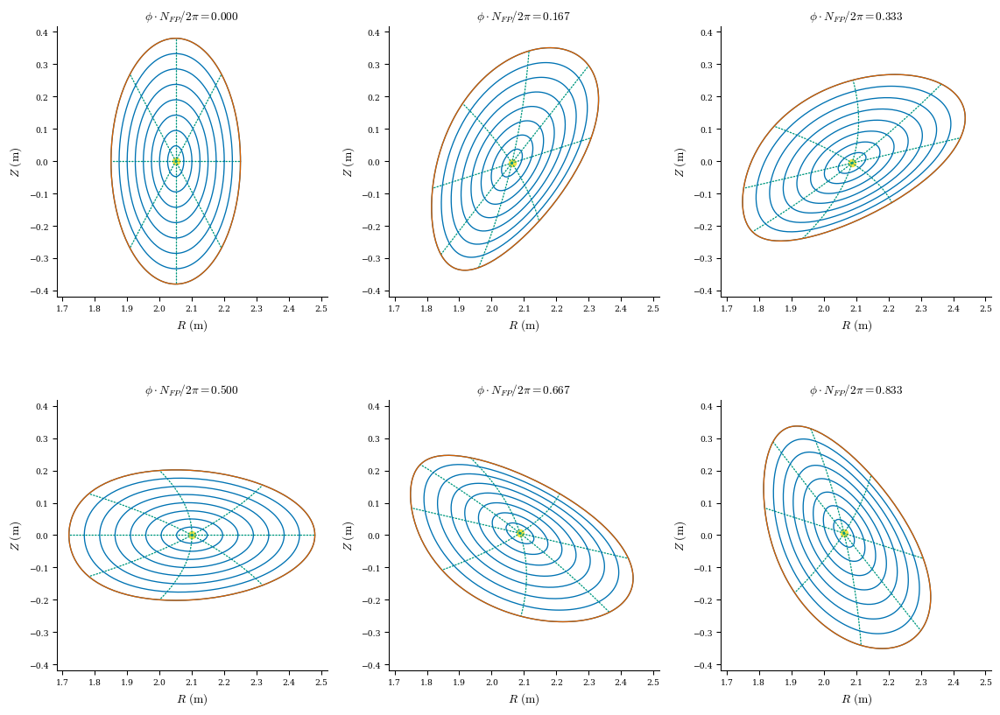

In [2]:
# for this example, we will use the LCFS of the ATF from DESC examples
lcfs = desc.examples.get("ATF").get_surface_at(rho=1)
# initialize the equilibrium object with the LCFS
eq = Equilibrium(surface=lcfs)
# plot flux surfaces of the initial guess
plot_surfaces(eq);

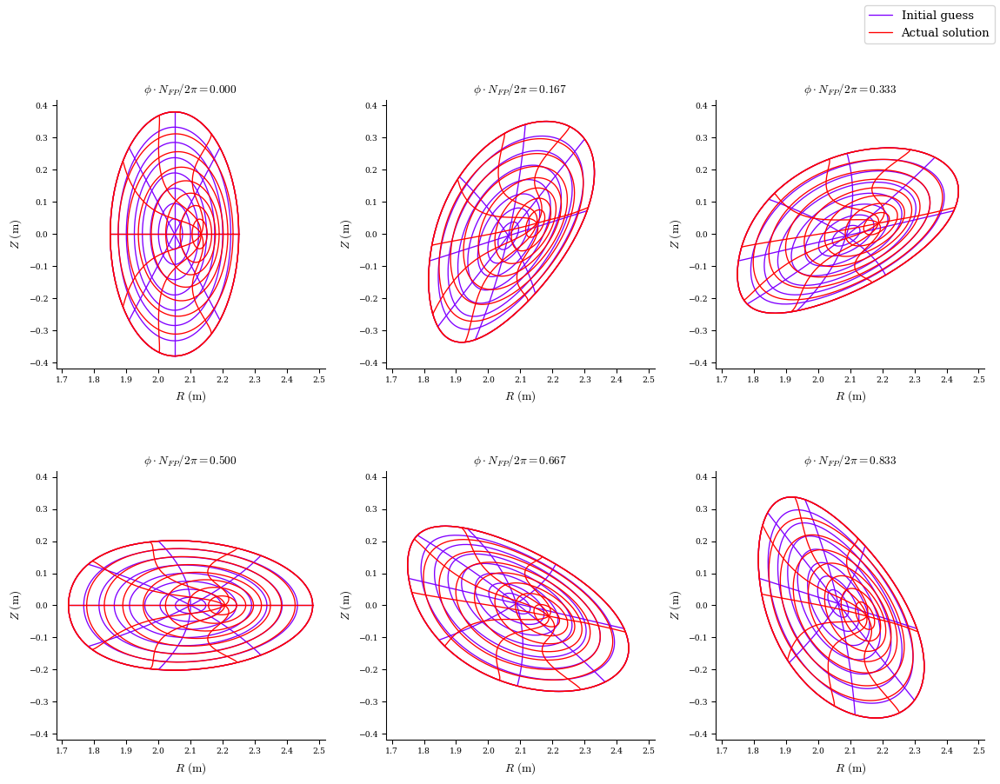

In [3]:
eq_solved = desc.examples.get("ATF")
# we can also compare the initial guess with the actual solution
plot_comparison(eqs=[eq, eq_solved], labels=["Initial guess", "Actual solution"]);

## Computational Domain

The toroidal domain that we are working on has a couple symmetry properties that allow us to reduce the computational domain. These are 
- Number of field periods symmetry (NFP)
- Stellarator symmetry (up-down symmetry)

Number of field periods symmetry is basically an integer quantifying how many times a certain region repeats itself along the toroidal direction. If flux surface shapes are known for a toroidal angle of $2\pi/NFP$ then, the full $2\pi$ can be found simply by repeating it.

Stellarator symmtry can be shown as,

$$R(\rho, \theta, \zeta) = R(\rho, -\theta, -\zeta) $$
$$Z(\rho, \theta, \zeta) = - Z(\rho, -\theta, -\zeta) $$
$$\lambda(\rho, \theta, \zeta) = - \lambda(\rho, -\theta, -\zeta) $$

Let's see these in effect visually! Here, we will use `ARIES-CS` equilibrium with $NFP$=3. First, apply the $NFP$ symmetry,

In [4]:
eq = desc.examples.get("ARIES-CS")
grid = LinearGridFlux(
    rho=1,
    theta=np.linspace(0, 2 * np.pi, 60),
    zeta=np.linspace(0, 2 * np.pi / eq.NFP, 60),
    sym=False,
)

fig = plot_3d(eq, "|B|", grid=grid)
fig = plot_3d(eq, "|B|", alpha=0.2, fig=fig)
fig.show()

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.



The full toroidal domain, shown transparent, is formed by repeating the solid part 3 times along the toroidal direction. 

Now, we will consider stellarator symmetry. This symmetry property will help us reduce the computational domain further by eliminating the redundant grid points from the computation by using the 3 identities given above that makes them duplicates of some other points. One can choose a range of $\theta, \zeta$ to satisfy those. However, it is not unique, and the choice can be different for other codes. In DESC, if the equilibrium of interest has stellarator symmetry, we only consider $\theta\in[0, \pi]$ and $\zeta\in[0, 2\pi/NFP]$. See [Grid Dev Guide](https://desc-docs--1304.org.readthedocs.build/en/1304/notebooks/dev_guide/grid.html#Symmetry) for some other considerations related to stellarator symmetry.

Let's see the final computational domain!

In [5]:
grid = LinearGridFlux(
    rho=1,
    theta=np.linspace(0, 2 * np.pi, 60),
    zeta=np.linspace(0, 2 * np.pi / eq.NFP, 60),
    sym=True,
)

fig = plot_3d(eq, "|B|", grid=grid)
fig = plot_3d(eq, "|B|", alpha=0.2, fig=fig)
fig.show()

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.



DESC is a pseudo-spectral code, this means we evaluate the functions on given points, and don't leave them in spectral form always. For force balance problem, we use a `ConcentricGridFlux` (see [Grid Dev Guide](https://desc-docs.readthedocs.io/en/latest/notebooks/dev_guide/grid.html) for details). The force balance error $\mathbf{J}\times \mathbf{B} - \nabla p$ is evaluated at those points.

In [6]:
grid_points = ConcentricGridFlux(
    L=5,
    M=5,
    N=5,
    NFP=eq.NFP,
    sym=True,
)

data = eq.compute(["X", "Y", "Z"], grid=grid_points)
x = data["X"]
y = data["Y"]
z = data["Z"]
fig = plot_3d(eq, "|B|", alpha=0.1)
fig = plot_3d(eq, "|B|", grid=grid, alpha=0.95, fig=fig)
fig.add_trace(
    go.Scatter3d(
        x=x, y=y, z=z, mode="markers", marker=dict(color="black", size=6, opacity=1)
    )
)
fig.show()

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

/home/dudt/DESC/desc/utils.py:572: UserWarning:

Unequal number of field periods for grid 1 and basis 3.

